In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from brain_image.utils import setup_logging


setup_logging()

In [3]:
from pathlib import Path
from brain_image.model.eeg_alignment import EEGAlignmentModel


checkpoint_path = Path("checkpoints/prior/checkpoints/train_eeg-epoch_431-val-loss_1.0122.ckpt")
model = EEGAlignmentModel.load_from_checkpoint(checkpoint_path)
model.eval()



11:04:00 | INFO     | Resolving workspace directory, traversing up from starting from /home/gasparyanartur/dev/brain-image-implementation/src/brain_image/configs.py
11:04:00 | INFO     | Current directory: /home/gasparyanartur/dev/brain-image-implementation/src/brain_image
11:04:00 | INFO     | Current directory: /home/gasparyanartur/dev/brain-image-implementation/src
11:04:00 | INFO     | Current directory: /home/gasparyanartur/dev/brain-image-implementation
11:04:00 | INFO     | Found pyproject.toml
11:04:03 | INFO     | Getting embedding stats for ['clip_vith14'] - 16540 images
11:04:16 | INFO     | Keys gathered: dict_keys(['clip_vith14'])
11:04:16 | INFO     | Finished getting embeddings dict_keys(['clip_vith14'])
11:04:16 | INFO     | Finished getting embedding stats
11:04:16 | INFO     | Embeddings stats:
11:04:16 | INFO     | 	prior_img_latent: <class 'dict'>
11:04:16 | INFO     | 	prior_img_latent.mean: tensor([-0.0020,  0.0969,  0.0407,  ..., -0.0857, -0.0866,  0.2875])
11:04

EEGAlignmentModel(
  (loss): CrossEntropyLoss()
  (prior): SimpleDiffusionPrior(
    (time_proj): Timesteps()
    (input_proj): Sequential(
      (0): Linear(in_features=1024, out_features=1024, bias=True)
      (1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (2): SiLU()
    )
    (time_encoders): ModuleList(
      (0): TimestepEmbedding(
        (linear_1): Linear(in_features=512, out_features=1024, bias=True)
        (act): SiLU()
        (linear_2): Linear(in_features=1024, out_features=1024, bias=True)
      )
      (1): TimestepEmbedding(
        (linear_1): Linear(in_features=512, out_features=512, bias=True)
        (act): SiLU()
        (linear_2): Linear(in_features=512, out_features=512, bias=True)
      )
      (2): TimestepEmbedding(
        (linear_1): Linear(in_features=512, out_features=256, bias=True)
        (act): SiLU()
        (linear_2): Linear(in_features=256, out_features=256, bias=True)
      )
      (3): TimestepEmbedding(
        (linear_1): 

In [5]:
model.loggers

[]

In [5]:
dl = model.test_dataloader()
ex_batch = next(iter(dl))


09:27:22 | INFO     | Loading test dataset
09:27:22 | INFO     | Loaded 200 samples
09:27:22 | INFO     | Preloading latents in parallel with 16 workers
09:27:22 | INFO     | Preloaded 200 latents


In [6]:
import torch
device, dtype = model._get_device_dtype()
with torch.no_grad():
    eeg_latent, eeg_latent_normed = model.get_eeg_latent(ex_batch, device, dtype)



/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torch/_inductor/compile_fx.py:236: UserWarning: TensorFloat32 tensor cores for float32 matrix multiplication available but not enabled. Consider setting `torch.set_float32_matmul_precision('high')` for better performance.
  warnings.warn(


In [7]:
model.data_module.embedding_stats

{'prior_img_latent': {'mean': tensor([-0.0020,  0.0969,  0.0407,  ..., -0.0857, -0.0866,  0.2875]),
  'std': tensor([0.4657, 0.4816, 0.4836,  ..., 0.4944, 0.4910, 0.4939]),
  'min': tensor([-1.5325, -2.0225, -1.5808,  ..., -1.8227, -2.0034, -1.7975]),
  'max': tensor([1.8429, 1.9183, 1.7952,  ..., 1.6703, 1.7763, 2.2460]),
  'norm': tensor(22.1930)}}

In [8]:
model.prior.config.norm_scheme = "z_scale"
prior_pred = model.get_all_prior_preds(eeg_latent_normed)

Prior sampling: 100%|██████████| 200/200 [00:00<00:00, 549.05it/s]


In [9]:
target_latent = ex_batch["prior_img_latent"]

In [10]:
import torch
import torch.nn.functional as F


with torch.no_grad():
    #conditioning = torch.cat(
    #    [F.normalize(prior_pred), F.normalize(target_latent)], dim=0
    #)
    conditioning = F.normalize(prior_pred)

recon_pred = model.get_prior_reconstructions(
    conditioning, pipe_kwargs={"progress_bar": True}
)

#recon_pred, recon_target = recon.chunk(2)

Keyword arguments {'device': device(type='cuda', index=0)} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Reconstructing latents: 100%|██████████| 200/200 [01:41<00:00,  1.97it/s]


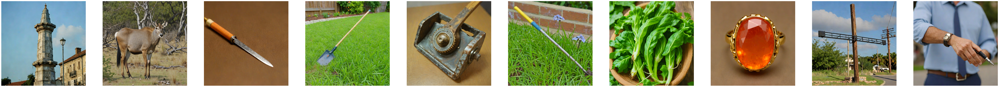

In [11]:
from brain_image.utils import show_image


show_image(recon_pred[:10])

09:29:29 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
09:29:29 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..249.0].
09:29:29 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
09:29:29 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
09:29:29 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..221.0].
09:29:29 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
09:29:29 | WARNING  | Clipping input data to the valid range for

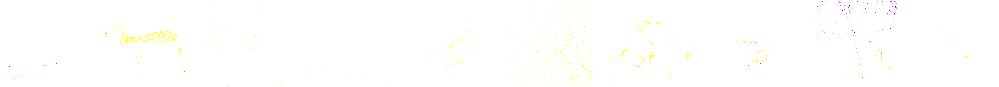

In [12]:
from brain_image.data import batch_load_images


img_paths = ex_batch["img_path"]
gts = batch_load_images(img_paths)
show_image(gts[:10])

In [13]:
from brain_image.model.img_encoder import load_image_encoder


img_enc = load_image_encoder("clip_vith14")
gts_pp = img_enc.preprocess(gts)
gts_pp.shape

torch.Size([200, 3, 224, 224])

In [14]:
from brain_image.reconstruction import IPAdapterReconstructionPipeline


pipe = IPAdapterReconstructionPipeline.load_pretrained()

Keyword arguments {'device': device(type='cuda')} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [15]:
recon_pred.min(), recon_pred.max(), recon_pred.shape

(tensor(0., device='cuda:0'),
 tensor(1., device='cuda:0'),
 torch.Size([200, 3, 512, 512]))

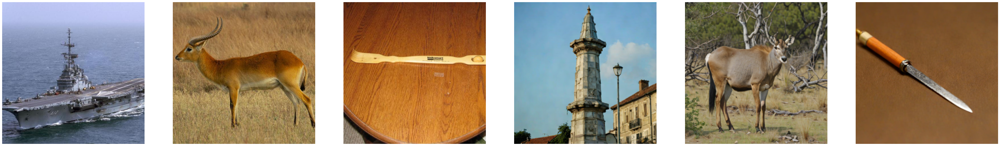

In [16]:
import torchvision.transforms.v2 as tv2
resize_pipe = tv2.Compose([
    tv2.Resize(425, tv2.InterpolationMode.BILINEAR),
    tv2.ToDtype(torch.float, scale=True),
])

gtsp = resize_pipe(gts)
recon_pred = resize_pipe(recon_pred)
show_image(gtsp[:3], recon_pred[:3])

In [17]:
import numpy as np

from brain_image.metrics import get_metric_pixcorr


# tensor(0.1554)
pixcorr =  get_metric_pixcorr(recon_pred.cpu(), gtsp.cpu())
pixcorr

tensor(0.1572)

In [ ]:
from brain_image.metrics import get_metric_ssim

# tensor(0.3080)
ssim =  get_metric_ssim(recon_pred, gtsp)
ssim

tensor(0.3080)

In [ ]:




from brain_image.metrics import get_metric_alex_score

# (tensor(0.8244), tensor(0.8803))
alex2 = get_metric_alex_score(recon_pred, gtsp, "alexnet2")
alex5 = get_metric_alex_score(recon_pred, gtsp, "alexnet5")
alex2, alex5

(tensor(0.8244), tensor(0.8803))

In [22]:


from brain_image.metrics import get_metric_inceptionv3_score

# tensor(0.7644)
inception = get_metric_inceptionv3_score(recon_pred, gtsp)
inception

/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torchvision/models/feature_extraction.py:175: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)


tensor(0.7526)

In [23]:


from brain_image.metrics import get_metric_clip


# tensor(0.8222)
clip = get_metric_clip(recon_pred, gtsp)
clip


/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/clip/clip.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging


tensor(0.8167)

In [26]:


from brain_image.metrics import get_metric_efficientnet

# tensor(0.8571)
eff = get_metric_efficientnet(recon_pred, gtsp)
eff

tensor(0.8628)

In [27]:

from brain_image.metrics import get_metric_swav

# tensor(0.5377)
swav = get_metric_swav(recon_pred, gtsp)
swav

/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


tensor(0.5442)